In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import branca.colormap as cm
import seaborn as sns
import random
import folium
import statsmodels.formula.api as sm
from statsmodels.stats.anova import anova_lm
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
df = pd.read_csv("crime data in USA 2023 (1).csv")

In [2]:
# Bản sao dataframe cho việc plot sau này
df_for_plot = df.copy()

In [3]:
df.head(3)

,DR_NO,DATE OCC,AREA NAME,TIME OCC,Part 1-2,Vict Sex,Vict Descent,Weapon Used Cd,LAT,LON,Vict Age,Crm Cd Desc
0,230611294,2023-06-17,Hollywood,1140,1,X,X,NaN,34.0981,-118.3092,0,SHOPLIFTING - PETTY THEFT ($950 & UNDER)
1,230106843,2023-02-11,Central,1630,1,M,H,NaN,34.0396,-118.2726,48,THEFT PLAIN - PETTY ($950 & UNDER)
2,231515059,2023-09-19,N Hollywood,1030,1,F,W,102.0,34.1721,-118.3616,36,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"


# Tiền xử lý dữ liệu và phân tích thăm dò cho biến số

## Tiền xử lý dữ liệu

In [6]:
df.describe()

,DR_NO,TIME OCC,Part 1-2,Weapon Used Cd,LAT,LON,Vict Age
count,2.321670e+05,232167.000000,232167.000000,78665.000000,232167.000000,232167.000000,232167.000000
mean,2.313325e+08,1342.703196,1.397481,367.082438,34.073406,-118.352171,28.763291
std,1.838708e+06,649.566241,0.489378,123.412352,0.179121,0.502281,22.205281
min,2.315000e+03,1.000000,1.000000,101.000000,0.000000,-118.667600,-1.000000
25%,2.306011e+08,900.000000,1.000000,312.000000,34.016500,-118.429800,0.000000
50%,2.311128e+08,1425.000000,1.000000,400.000000,34.059100,-118.322200,30.000000
75%,2.316122e+08,1900.000000,2.000000,400.000000,34.163800,-118.273900,44.000000
max,2.421124e+08,2359.000000,2.000000,516.000000,34.328900,0.000000,99.000000


In [7]:
df.describe(include='object')

,DATE OCC,AREA NAME,Vict Sex,Vict Descent,Crm Cd Desc
count,232167,232167,200693,200689,232167
unique,365,21,5,20,135
top,2023-01-01,Central,M,H,VEHICLE - STOLEN
freq,1150,16957,91714,69361,24465


In [8]:
df.shape

(232167, 12)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232167 entries, 0 to 232166
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           232167 non-null  int64  
 1   DATE OCC        232167 non-null  object 
 2   AREA NAME       232167 non-null  object 
 3   TIME OCC        232167 non-null  int64  
 4   Part 1-2        232167 non-null  int64  
 5   Vict Sex        200693 non-null  object 
 6   Vict Descent    200689 non-null  object 
 7   Weapon Used Cd  78665 non-null   float64
 8   LAT             232167 non-null  float64
 9   LON             232167 non-null  float64
 10  Vict Age        232167 non-null  int64  
 11  Crm Cd Desc     232167 non-null  object 
dtypes: float64(3), int64(4), object(5)
memory usage: 21.3+ MB


In [10]:
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])

In [11]:
df['DATE OCC'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 232167 entries, 0 to 232166
Series name: DATE OCC
Non-Null Count   Dtype         
--------------   -----         
232167 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.8 MB


In [12]:
print(df.isnull().sum())

DR_NO                  0
DATE OCC               0
AREA NAME              0
TIME OCC               0
Part 1-2               0
Vict Sex           31474
Vict Descent       31478
Weapon Used Cd    153502
LAT                    0
LON                    0
Vict Age               0
Crm Cd Desc            0
dtype: int64


In [13]:
df["Weapon Used Cd"] = df["Weapon Used Cd"].fillna(0)

In [14]:
df = df.dropna(subset =["Vict Sex", "Vict Descent"])

In [15]:
df.isnull().sum()

DR_NO             0
DATE OCC          0
AREA NAME         0
TIME OCC          0
Part 1-2          0
Vict Sex          0
Vict Descent      0
Weapon Used Cd    0
LAT               0
LON               0
Vict Age          0
Crm Cd Desc       0
dtype: int64

In [16]:
print(df.columns)

Index(['DR_NO', 'DATE OCC', 'AREA NAME', 'TIME OCC', 'Part 1-2', 'Vict Sex',
       'Vict Descent', 'Weapon Used Cd', 'LAT', 'LON', 'Vict Age',
       'Crm Cd Desc'],
      dtype='object')


## Phân tích thăm dò cho biến số

In [18]:
optimal_sample_size = 14000 # Có thể tăng nếu máy bạn đủ mạnh

# Lấy mẫu ngẫu nhiên
df = df.sample(n=optimal_sample_size, random_state=0) 

### Lọc ngoại lai

In [20]:
from scipy.stats import zscore

# Lọc danh sách các cột số (chỉ tính z-score trên các cột phù hợp)
columns = ['Weapon Used Cd', 'LAT', 'LON', 'Vict Age', 'TIME OCC']

# Lưu ngoại lai cho từng cột
for col in columns:
    df[f'{col}_zscore'] = zscore(df[col])  # Tính Z-Score cho cột hiện tại
    outliers = df[(df[f'{col}_zscore'] > 3) | (df[f'{col}_zscore'] < -3)]  # Lọc ngoại lai
    print(f"Outliers in {col}:")
    print(outliers)


Outliers in Weapon Used Cd:
Empty DataFrame
Columns: [DR_NO, DATE OCC, AREA NAME, TIME OCC, Part 1-2, Vict Sex, Vict Descent, Weapon Used Cd, LAT, LON, Vict Age, Crm Cd Desc, Weapon Used Cd_zscore]
Index: []
Outliers in LAT:
            DR_NO   DATE OCC AREA NAME  TIME OCC  Part 1-2 Vict Sex  \
34391   230517457 2023-12-30    Harbor       130         2        F   
91588   230509854 2023-06-09    Harbor       800         1        M   
79087   230507576 2023-04-07    Harbor      2030         1        F   
181516  230509125 2023-04-09    Harbor      1200         2        F   
165346  230512336 2023-08-15    Harbor      1520         2        X   
...           ...        ...       ...       ...       ...      ...   
200204  230514182 2023-09-15    Harbor       800         2        F   
28634   230517025 2023-12-18    Harbor       900         2        F   
9957    230500677 2023-06-18    Harbor      2135         2        M   
6681    230510348 2023-06-23    Harbor      1130         2       

In [21]:
df.head(3)

,DR_NO,DATE OCC,AREA NAME,TIME OCC,Part 1-2,Vict Sex,Vict Descent,Weapon Used Cd,LAT,LON,Vict Age,Crm Cd Desc,Weapon Used Cd_zscore,LAT_zscore,LON_zscore,Vict Age_zscore,TIME OCC_zscore
198370,231405734,2023-02-11,Pacific,600,2,M,W,0.0,33.9955,-118.4210,34,THEFT OF IDENTITY,-0.724631,-0.734560,-0.619893,0.046118,-1.126509
191455,231904311,2023-01-08,Mission,1700,2,M,H,0.0,34.2317,-118.4502,57,VIOLATION OF RESTRAINING ORDER,-0.724631,1.452274,-0.895615,1.168829,0.573191
113162,230219104,2023-10-13,Rampart,1805,1,M,H,500.0,34.0583,-118.2616,15,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1.859917,-0.153133,0.885242,-0.881339,0.735435


In [22]:
for col in columns:
    df = df[(df[f'{col}_zscore'] <= 3) & (df[f'{col}_zscore'] >= -3)] # xóa các hàng có gtri ngoại lai
for col in columns:
    df = df.drop(columns = [f'{col}_zscore']) # xóa các cột tên có dạng col_zscore đi

In [23]:
df.shape

(13777, 12)

### Tính hệ số tương quan giữa các cột với nhau

In [25]:
from scipy.stats import pearsonr

# Các cột định lượng để tính tương quan
columns = ['Weapon Used Cd', 'LAT', 'LON', 'Vict Age', 'TIME OCC']

# Tạo một DataFrame để lưu kết quả
correlation_results = []

# Tính hệ số tương quan và p-value cho từng cặp cột
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        col1 = columns[i]
        col2 = columns[j]
        
        # Tính Pearson correlation và p-value
        r, p_value = pearsonr(df[col1], df[col2])
        
        # Lưu kết quả
        correlation_results.append((col1, col2, r, p_value))

# Chuyển đổi thành DataFrame
correlation_df = pd.DataFrame(correlation_results, columns=['Column 1', 'Column 2', 'Correlation (r)', 'P-Value'])

# In kết quả
print(correlation_df)


         Column 1  Column 2  Correlation (r)       P-Value
0  Weapon Used Cd       LAT        -0.072143  2.289884e-17
1  Weapon Used Cd       LON         0.072426  1.718448e-17
2  Weapon Used Cd  Vict Age         0.075018  1.176117e-18
3  Weapon Used Cd  TIME OCC         0.020758  1.483139e-02
4             LAT       LON        -0.607143  0.000000e+00
5             LAT  Vict Age         0.047416  2.575606e-08
6             LAT  TIME OCC         0.007112  4.038873e-01
7             LON  Vict Age        -0.070609  1.064586e-16
8             LON  TIME OCC        -0.013964  1.012264e-01
9        Vict Age  TIME OCC        -0.010454  2.198338e-01


### Vẽ biểu đồ ma trận tương quan giữa các biến

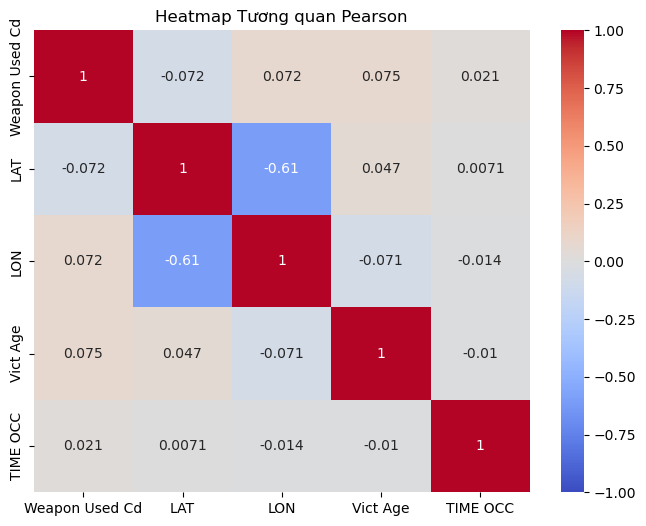

In [27]:
# Tạo ma trận tương quan
correlation_matrix = df[columns].corr(method='pearson')

# Vẽ heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap Tương quan Pearson')
plt.show()

In [28]:
# Loại bỏ các hàng có 'Vict Age' bằng 0
df = df[df['Vict Age'] != 0]

# Loại bỏ các hàng có 'Weapon Used Cd' bằng 0
df = df[df['Weapon Used Cd'] != 0]

df.isnull().sum()

DR_NO             0
DATE OCC          0
AREA NAME         0
TIME OCC          0
Part 1-2          0
Vict Sex          0
Vict Descent      0
Weapon Used Cd    0
LAT               0
LON               0
Vict Age          0
Crm Cd Desc       0
dtype: int64

# Tiền xử lý và thăm dò dữ liệu biến phân loại

## Tiếp tục tiền xử lý

### Thêm cột Weapon Type theo Weapon Used Cd cho df

In [32]:
# Tạo dictionary ánh xạ mã vũ khí sang loại vũ khí
weapon_type_mapping = {
    0: "Unknown",
    101: "Firearm", 102: "Firearm", 103: "Firearm", 104: "Firearm", 105: "Firearm",
    106: "Firearm", 107: "Firearm", 108: "Firearm", 109: "Firearm", 110: "Firearm",
    111: "Firearm", 112: "Firearm", 113: "Firearm",114: "Firearm", 115: "Firearm", 116: "Firearm", 117:"Firearm", 118:"Firearm", 119:"Firearm", 120:"Firearm", 121:"Firearm", 122:"Firearm", 123:"Firearm", 124:"Firearm", 125:"Firearm",
    200: "Knife", 201: "Knife", 202: "Knife", 203: "Knife", 204: "Knife", 205: "Knife",
    206: "Knife", 207: "Knife", 208: "Knife", 209: "Knife", 210: "Knife", 214:"Knife", 217:"Knife",
    211: "Blunt Object", 212: "Blunt Object", 213: "Blunt Object", 215: "Blunt Object", 216:"Blunt Object", 218:"Blunt Object", 219:"Blunt Object", 220:"Blunt Object", 221: "Blunt Object", 223:"Blunt Object", 
    300: "Blunt Object", 301: "Blunt Object", 302: "Blunt Object", 303: "Blunt Object", 304: "Blunt Object", 305:"Blunt Object", 306:"Blunt Object", 307:"Blunt Object", 308:"Blunt Object", 309:"Blunt Object", 310:"Blunt Object", 311:"Blunt Object", 312:"Blunt Object",
    500: "Other", 501: "Other", 502: "Other", 503: "Other", 504: "Other", 505: "Other", 506:"Other", 507:"Other", 508:"Other", 509:"Other", 510:"Other", 511:"Other", 512:"Other", 513:"Other", 514:"Other", 515:"Other", 516:"Other", 400:"Strong-arm"

}

# Ánh xạ mã vũ khí sang loại vũ khí trong DataFrame df_data
df['Weapon Type'] = df['Weapon Used Cd'].map(weapon_type_mapping).fillna("Unknown")


In [33]:
print((df['Weapon Type'] == 'Unknown').sum())

0


### Thêm cột Age Group theo Vict Age cho df

In [35]:
# Định nghĩa các nhóm tuổi và nhãn tương ứng
bins = [0, 18, 25, 35, 50, 65, 100]  # Điều chỉnh các ngưỡng theo nhu cầu
labels = ['<18', '18-24', '25-34', '35-49', '50-64', '65+']

# Tạo cột 'Age Group'
df['Age Group'] = pd.cut(df['Vict Age'], bins=bins, labels=labels, right=False)

In [36]:
df['Age Group']

113162      <18
25239     50-64
206956    50-64
68553     50-64
84158     25-34
          ...  
167087    35-49
89734     18-24
221384    25-34
224179    35-49
24993       <18
Name: Age Group, Length: 4865, dtype: category
Categories (6, object): ['<18' < '18-24' < '25-34' < '35-49' < '50-64' < '65+']

### Thêm cột Descent Desc theo Vict Desc cho df

In [38]:
# Tạo dictionary ánh xạ 'Vict Descent' sang 'Descent Desc'
descent_mapping = {
    'A': 'Other Asian',
    'B': 'Black',
    'C': 'Chinese',
    'D': 'Cambodian',
    'F': 'Filipino',
    'G': 'Guamanian',
    'H': 'Hispanic/Latin/Mexican',
    'I': 'American Indian/Alaskan Native',
    'J': 'Japanese',
    'K': 'Korean',
    'L': 'Laotian',
    'O': 'Other',
    'P': 'Pacific Islander',
    'S': 'Samoan',
    'U': 'Hawaiian',
    'V': 'Vietnamese',
    'W': 'White',
    'X': 'Unknown',
    'Z': 'Asian Indian'
}

# Tạo cột 'Descent Desc' bằng cách ánh xạ giá trị từ 'Vict Descent'
df['Descent Desc'] = df['Vict Descent'].map(descent_mapping)

# In kết quả
print(df[['Vict Descent', 'Descent Desc']])

       Vict Descent            Descent Desc
113162            H  Hispanic/Latin/Mexican
25239             H  Hispanic/Latin/Mexican
206956            H  Hispanic/Latin/Mexican
68553             W                   White
84158             O                   Other
...             ...                     ...
167087            H  Hispanic/Latin/Mexican
89734             B                   Black
221384            H  Hispanic/Latin/Mexican
224179            B                   Black
24993             H  Hispanic/Latin/Mexican

[4865 rows x 2 columns]


### Thêm cột Sex theo Vict Sex cho df

In [40]:
# Tạo dictionary ánh xạ 'Vict Descent' sang 'Descent Desc'
sex_mapping = {
    'F': 'Nữ',
    'M': 'Nam',
    'X': 'Không rõ'
}

# Tạo cột 'Descent Desc' bằng cách ánh xạ giá trị từ 'Vict Descent'
df['Sex'] = df['Vict Sex'].map(sex_mapping)


# In kết quả
print(df[['Vict Sex', 'Sex']])

       Vict Sex  Sex
113162        M  Nam
25239         F   Nữ
206956        F   Nữ
68553         F   Nữ
84158         M  Nam
...         ...  ...
167087        M  Nam
89734         F   Nữ
221384        M  Nam
224179        F   Nữ
24993         M  Nam

[4865 rows x 2 columns]


### Thêm cột Time Span theo Time OCC cho df

In [42]:
# Loại bỏ các dòng có 'TIME OCC' nhỏ hơn 100
df = df[df['TIME OCC'] >= 100]

In [43]:
# Hàm chuyển đổi 'TIME OCC' sang 'TIME SPAN'
def convert_time_span(time_occ):
    try:
        time_occ = int(time_occ) #chuyển sang số nguyên
        hour = time_occ // 100
        next_hour = (hour + 1) % 24  # Xử lý trường hợp 23:00 -> 00:00

        return f"{hour:02d}:00 - {next_hour:02d}:00"
    except (ValueError, TypeError): #xử lý trường hợp không phải số
        return None #hoặc giá trị khác tùy ý


# Tạo cột 'TIME SPAN'
df['TIME SPAN'] = df['TIME OCC'].apply(convert_time_span)

# Loại bỏ các dòng không hợp lệ (nếu cần)
df.dropna(subset=['TIME SPAN'], inplace=True)


### Định dạng dữ liệu cho cột Crm Cd Desc

In [45]:
df['Crm Cd Desc'].value_counts()

Crm Cd Desc
BATTERY - SIMPLE ASSAULT                          1205
ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT     779
INTIMATE PARTNER - SIMPLE ASSAULT                  689
ROBBERY                                            401
CRIMINAL THREATS - NO WEAPON DISPLAYED             281
                                                  ... 
THEFT FROM PERSON - ATTEMPT                          1
TRESPASSING                                          1
BOMB SCARE                                           1
DRUNK ROLL                                           1
LEWD CONDUCT                                         1
Name: count, Length: 68, dtype: int64

In [46]:
# Tách chuỗi và lấy giá trị trước dấu "-"
df['Crm Cd Desc'] = df['Crm Cd Desc'].str.split('-', n=1, expand=True)[0]
df['Crm Cd Desc'] = df['Crm Cd Desc'].str.split(',', n=1, expand=True)[0]

# In kết quả
df['Crm Cd Desc'].value_counts()

Crm Cd Desc
BATTERY                                                    1205
INTIMATE PARTNER                                            888
ASSAULT WITH DEADLY WEAPON                                  779
ROBBERY                                                     401
CRIMINAL THREATS                                            281
BRANDISH WEAPON                                             227
BURGLARY                                                    115
VANDALISM                                                    87
BATTERY WITH SEXUAL CONTACT                                  67
OTHER ASSAULT                                                60
CHILD ABUSE (PHYSICAL)                                       55
ATTEMPTED ROBBERY                                            52
RAPE                                                         50
BURGLARY FROM VEHICLE                                        42
THEFT PLAIN                                                  36
THEFT                       

### Chuyển đổi kiểu một số dữ liệu qua object

In [48]:
df['Part 1-2'] = df['Part 1-2'].astype('object')
df['Weapon Used Cd'] = df['Weapon Used Cd'].astype('object')

In [49]:
df.dtypes

DR_NO                      int64
DATE OCC          datetime64[ns]
AREA NAME                 object
TIME OCC                   int64
Part 1-2                  object
Vict Sex                  object
Vict Descent              object
Weapon Used Cd            object
LAT                      float64
LON                      float64
Vict Age                   int64
Crm Cd Desc               object
Weapon Type               object
Age Group               category
Descent Desc              object
Sex                       object
TIME SPAN                 object
dtype: object

### Loại bỏ các giá trị không cần thiết (xuất hiện ít) trong một số cột

In [51]:
# Đếm số lần xuất hiện của mỗi giá trị
value_counts = df['Crm Cd Desc'].value_counts()

# Lọc ra các giá trị xuất hiện ít hơn 50 lần
filtered_values = value_counts[value_counts > 60].index

# Lọc DataFrame ban đầu để chỉ giữ lại các dòng có giá trị trong cột 'Crm Cd Desc' thuộc filtered_values
df = df[df['Crm Cd Desc'].isin(filtered_values)]

# In kết quả
df['Crm Cd Desc'].value_counts()

Crm Cd Desc
BATTERY                        1205
INTIMATE PARTNER                888
ASSAULT WITH DEADLY WEAPON      779
ROBBERY                         401
CRIMINAL THREATS                281
BRANDISH WEAPON                 227
BURGLARY                        115
VANDALISM                        87
BATTERY WITH SEXUAL CONTACT      67
Name: count, dtype: int64

In [52]:
df.describe(include='object')

,AREA NAME,Part 1-2,Vict Sex,Vict Descent,Weapon Used Cd,Crm Cd Desc,Weapon Type,Descent Desc,Sex,TIME SPAN
count,4050,4050,4050,4050,4050.0,4050,4050,4050,4050,4050
unique,21,2,3,8,52.0,9,5,8,3,23
top,77th Street,2,M,H,400.0,BATTERY,Strong-arm,Hispanic/Latin/Mexican,Nam,15:00 - 16:00
freq,368,2329,2112,2012,2256.0,1205,2256,2012,2112,250


### Chuẩn bị dữ liệu cho trực quan hóa

In [54]:
# Tạo bản sao của DataFrame
df_for_plot = df.copy()

# Chọn các cột object và category từ bản sao
obj_df = df_for_plot.select_dtypes(include=['object', 'category'])

In [55]:
obj_df = df.select_dtypes(['object', 'category'])
obj_df = obj_df.drop(df[['Weapon Used Cd', 'Vict Sex', 'Vict Descent']], axis = 1)

In [56]:
obj_df.describe(include=['object', 'category'])

,AREA NAME,Part 1-2,Crm Cd Desc,Weapon Type,Age Group,Descent Desc,Sex,TIME SPAN
count,4050,4050,4050,4050,4050,4050,4050,4050
unique,21,2,9,5,6,8,3,23
top,77th Street,2,BATTERY,Strong-arm,35-49,Hispanic/Latin/Mexican,Nam,15:00 - 16:00
freq,368,2329,1205,2256,1249,2012,2112,250


In [57]:
# Danh sách các cột cần vẽ riêng
cols_to_plot_separate_1 = ['AREA NAME', 'TIME SPAN', 'Crm Cd Desc']

cols_to_plot_separate_2 = ['Part 1-2', 'Age Group']

# Danh sách các cột cần vẽ chung (2 cột/hàng)
cols_to_plot_shared = [col for col in obj_df.columns if col not in cols_to_plot_separate_1 and col not in cols_to_plot_separate_2]

### Biểu đồ phân phối của từng biến phân loại

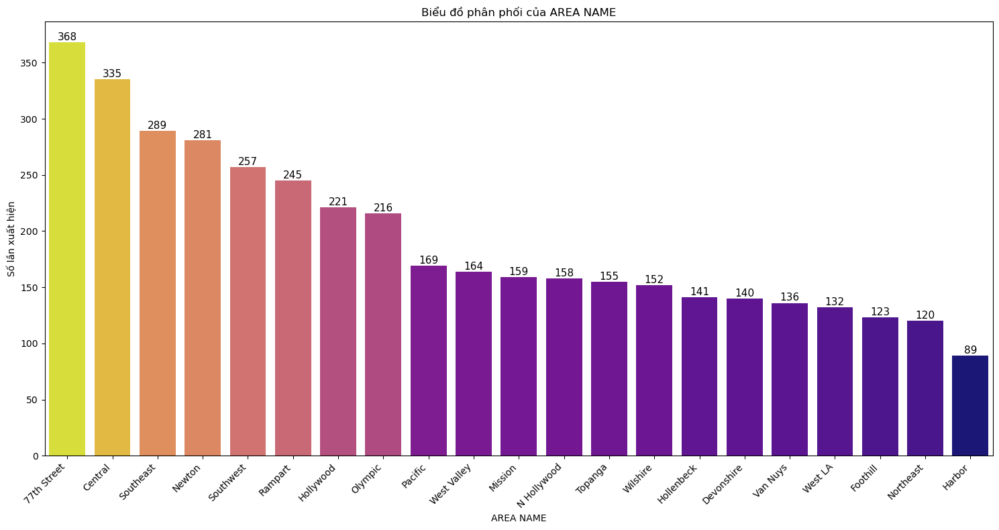

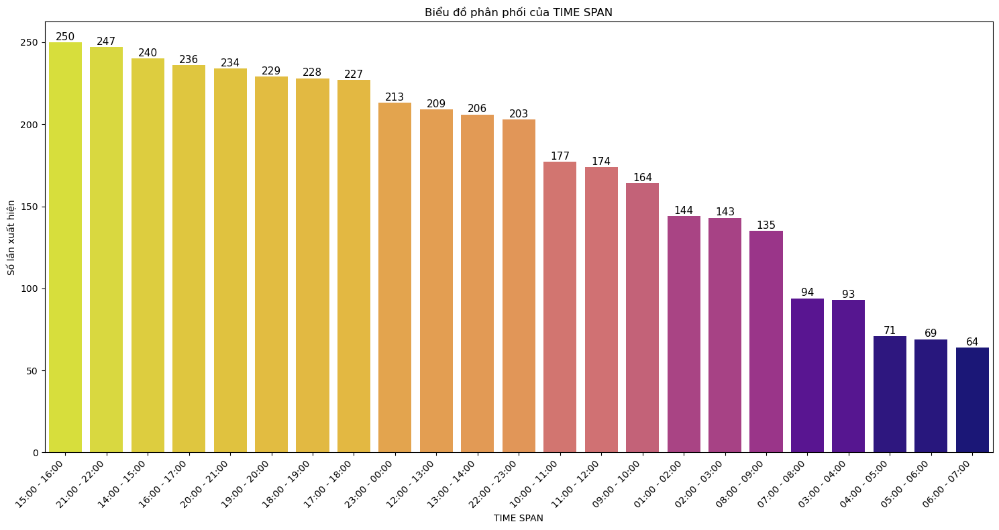

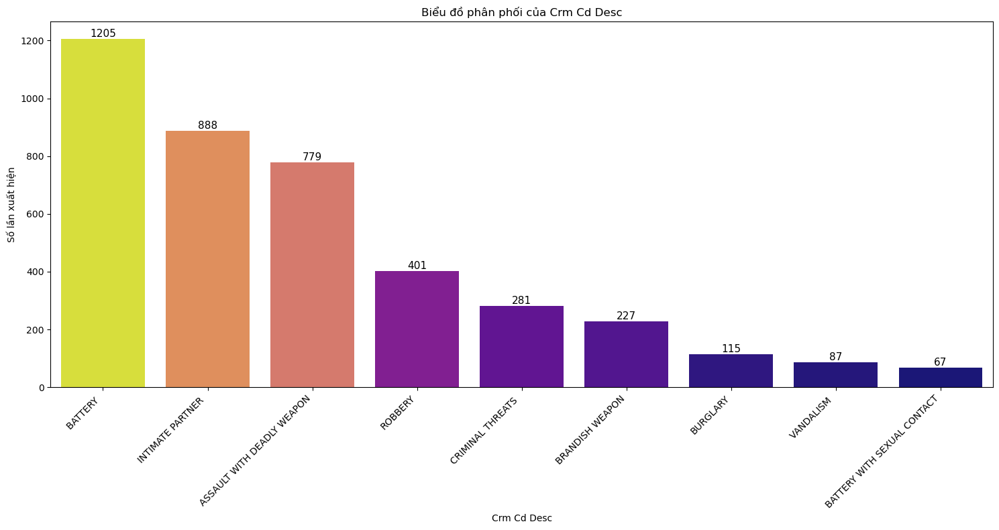

In [59]:
# Vẽ biểu đồ cho các cột riêng
for variable_name in cols_to_plot_separate_1:
    
    plt.figure(figsize=(15, 8)) 
    variable_counts = df[variable_name].value_counts().reset_index()
    variable_counts.columns = [variable_name, 'Số lần xuất hiện']
    
    cmap = plt.colormaps['plasma'] 
    norm = plt.Normalize(variable_counts['Số lần xuất hiện'].min(), variable_counts['Số lần xuất hiện'].max())
    colors = [cmap(norm(value)) for value in variable_counts['Số lần xuất hiện']]
    
    sns.barplot(x=variable_name, y='Số lần xuất hiện', data=variable_counts, palette=colors, hue=variable_name, dodge=False, legend=False)
    
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Biểu đồ phân phối của {variable_name}')
    
    for index, value in enumerate(variable_counts['Số lần xuất hiện']):
        plt.gca().text(index, value + 0.1, str(value), ha='center', va='bottom', fontsize=11)  
    plt.tight_layout()
    plt.show()

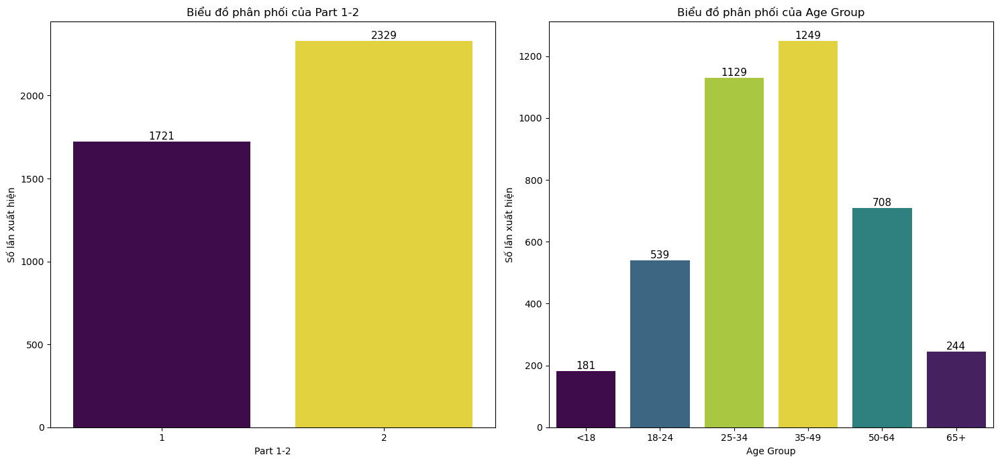

In [60]:
# Vẽ biểu đồ cho cols_to_plot_separate_2 trên cùng một hàng với màu sắc
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

for i, variable_name in enumerate(cols_to_plot_separate_2):
    
    ax = axes[i]
    variable_counts = df[variable_name].value_counts(sort=False).reset_index()
    variable_counts.columns = [variable_name, 'Số lần xuất hiện']
    
    cmap = plt.colormaps['viridis']
    norm = plt.Normalize(variable_counts['Số lần xuất hiện'].min(), variable_counts['Số lần xuất hiện'].max())
    colors = [cmap(norm(value)) for value in variable_counts['Số lần xuất hiện']]

    sns.barplot(x=variable_name, y='Số lần xuất hiện', data=variable_counts, ax=ax, hue=variable_name, palette=colors, dodge=False, legend=False)

    for index, value in enumerate(variable_counts['Số lần xuất hiện']):
        ax.text(index, value + 0.1, str(value), ha='center', va='bottom', fontsize=11)
    
    ax.set_title(f'Biểu đồ phân phối của {variable_name}')


plt.tight_layout()
plt.show()

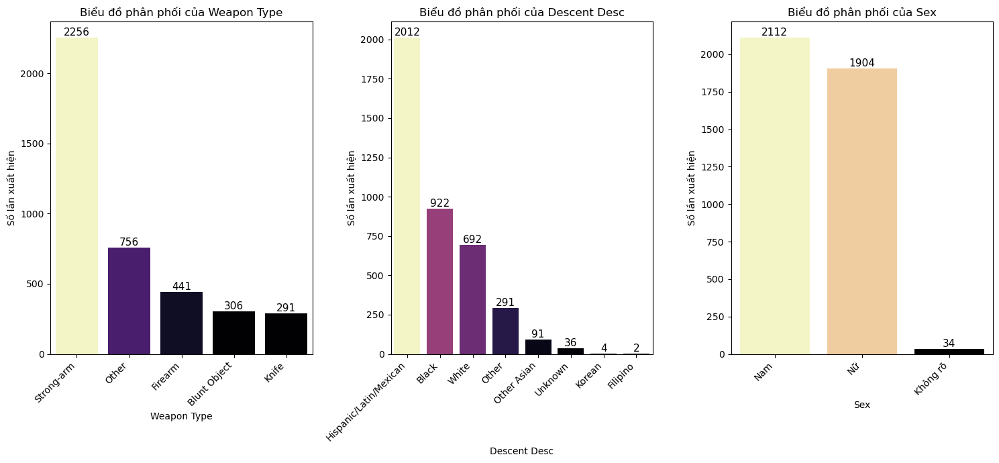

In [61]:
# Vẽ biểu đồ cho các cột chung (2 cột/hàng) với màu sắc
num_cols = 3
num_rows = int(len(cols_to_plot_shared) / num_cols) + (len(cols_to_plot_shared) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 7 * num_rows))

current_row = 0
current_col = 0

for variable_name in cols_to_plot_shared:
    ax = axes[current_row, current_col] if num_rows > 1 else axes[current_col] if num_cols > 1 else axes
    
    variable_counts = df[variable_name].value_counts().reset_index()
    variable_counts.columns = [variable_name, 'Số lần xuất hiện']
    
    # Tạo colormap và ánh xạ
    cmap = plt.colormaps['magma']  # Hoặc bảng màu khác bạn thích
    norm = plt.Normalize(variable_counts['Số lần xuất hiện'].min(), variable_counts['Số lần xuất hiện'].max())
    colors = [cmap(norm(value)) for value in variable_counts['Số lần xuất hiện']]

    sns.barplot(x=variable_name, y='Số lần xuất hiện', data=variable_counts, ax=ax, hue=variable_name, palette=colors, dodge=False, legend=False)

    for index, value in enumerate(variable_counts['Số lần xuất hiện']):
        ax.text(index, value + 0.1, str(value), ha='center', va='bottom', fontsize=11)

    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right') 

    ax.set_title(f'Biểu đồ phân phối của {variable_name}')

    current_col += 1
    if current_col == num_cols:
        current_col = 0
        current_row += 1


plt.tight_layout()
plt.show()

### Tìm mối quan hệ giữa biến `Vict Age` và các biến phân loại (ANOVA)

In [63]:
def anova_categorical(df, target_variable):

    categorical_vars = df.select_dtypes(include=['object', 'category']).columns

    # Loại bỏ cột mục tiêu khỏi danh sách biến phân loại
    categorical_vars = categorical_vars.drop(target_variable, errors='ignore')  

    significant_categorical_variables = []
    p_value_list = []
    f_test = []

    for col in categorical_vars:
        groups = [df[target_variable][df[col] == value] for value in df[col].unique()]

        if len(groups) >= 2 and all(len(group) > 0 for group in groups):
            # Chuyển đổi sang numeric, bỏ qua lỗi
            groups = [pd.to_numeric(group, errors='coerce').dropna() for group in groups]
            # Kiểm tra lại nhóm
            if len(groups) >= 2 and all(len(group) > 0 for group in groups):

                f_statistic, p_value = f_oneway(*groups)

                significant_categorical_variables.append(col)
                p_value_list.append(p_value)
                f_test.append(f_statistic)

    data = {
        'Attribute': significant_categorical_variables,
        'F_test': f_test,
        'P_value': p_value_list
    }
    return pd.DataFrame(data)



# Sử dụng hàm
result_df = anova_categorical(df, 'Vict Age')  # Hoặc tên cột biến mục tiêu khác
print(result_df)

         Attribute        F_test       P_value
0        AREA NAME      2.691253  6.656943e-05
1         Part 1-2      0.344016  5.575529e-01
2         Vict Sex     16.879788  5.007358e-08
3     Vict Descent     27.077329  1.446351e-36
4   Weapon Used Cd      2.255020  1.000083e-06
5      Crm Cd Desc     22.995475  1.013543e-34
6      Weapon Type     14.921434  4.140925e-12
7        Age Group  11876.928450  0.000000e+00
8     Descent Desc     27.077329  1.446351e-36
9              Sex     16.879788  5.007358e-08
10       TIME SPAN      2.726954  2.476662e-05


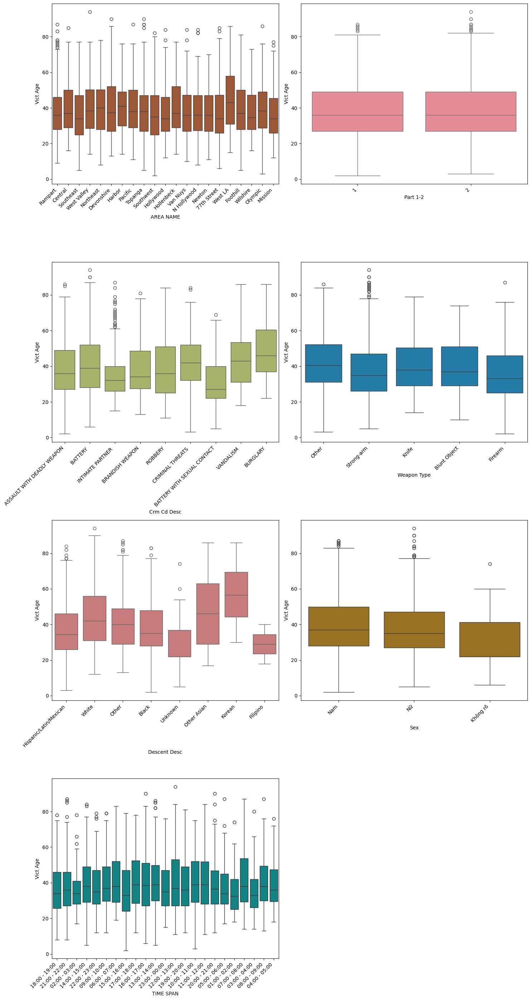

In [64]:
def box_plot(dataframe, target_variable): #thêm target_variable
    categorical_cols = dataframe.select_dtypes(include=['object', 'category']).columns
    length = len(categorical_cols)
    k = 2 #số cột trong subplot
    num_rows = (length + k - 1) // k #tính số hàng, làm tròn lên


    fig, axes = plt.subplots(num_rows, k, figsize=(15, 7 * num_rows))


    for i, column in enumerate(categorical_cols):
        row = i // k
        col_num = i % k
        ax = axes[row, col_num] if num_rows > 1 else axes[col_num] if k > 1 else axes
       
        colors_1 = random.random()
        colors_2 = random.random()
        colors_3 = random.random()
        
        sns.boxplot(data=dataframe, x=column, y=target_variable, ax=ax, color=(colors_1, colors_2, colors_3))

        ax.set_xticks(ax.get_xticks())
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


    # Loại bỏ subplot thừa (nếu có)
    if length < num_rows * k:
        for i in range(length, num_rows * k):
            row = i // k
            col_num = i % k
            fig.delaxes(axes[row, col_num])


    plt.tight_layout()


# Gọi hàm box_plot với DataFrame của bạn và tên cột biến mục tiêu
box_plot(obj_df.drop(columns='Age Group'), df['Vict Age']) 
plt.show()

### Tìm mối quan hệ giữa biến `Vict Age` và các biến phân loại (ANOVA)

In [66]:
from scipy.stats import chi2_contingency

# Select categorical variables
categorical_vars = df.select_dtypes(include=['object', 'category']).columns
categorical_vars = categorical_vars.drop('Crm Cd Desc', errors='ignore')

# Create a list to hold the results
results = []

# Loop through each categorical column
for col in categorical_vars:
    contingency_table = pd.crosstab(df['Crm Cd Desc'], df[col])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Append results to the list
    results.append({
        'Attribute': col,
        'Chi2 Statistic': chi2,
        'P-value': p,
        'Degrees of Freedom': dof
    })

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Print the results
print(results_df)

        Attribute  Chi2 Statistic        P-value  Degrees of Freedom
0       AREA NAME      565.983691   9.507219e-47                 160
1        Part 1-2     3418.142681   0.000000e+00                   8
2        Vict Sex      550.308914  7.721338e-107                  16
3    Vict Descent      307.587054   2.003504e-36                  56
4  Weapon Used Cd     7664.267671   0.000000e+00                 408
5     Weapon Type     4355.310396   0.000000e+00                  32
6       Age Group      306.546552   8.512492e-43                  40
7    Descent Desc      307.587054   2.003504e-36                  56
8             Sex      550.308914  7.721338e-107                  16
9       TIME SPAN      290.721619   1.163760e-07                 176


# Trực quan hóa dữ liệu

## Trực quan hóa cho theo `LAT` và `LON` từng khu vực

In [69]:
# Tạo bản đồ
m = folium.Map(location=[df['LAT'].mean(), df['LON'].mean()], zoom_start=10, tiles='OpenStreetMap')

# Tạo colormap
colormap = cm.LinearColormap(colors=['lightyellow', 'yellow', 'lightskyblue', 'dodgerblue'], vmin=df['Vict Age'].min(), vmax=df['Vict Age'].max(), 
                             index=[18, 35, 50, 65])


# Thêm marker
for index, row in df.iterrows():
    age = row['Vict Age']
    area_name = row['AREA NAME']
    sex = row['Sex']
    crm = row['Crm Cd Desc']
    time = row['TIME SPAN']
    color = colormap(age)

    popup_html = f"""
        <div style="width:200px;">  
            <b>Tuổi:</b> {age}<br>
            <b>Nhóm tuổi:</b> {row['Age Group']}<br>
            <b>Khu vực:</b> {area_name}<br>

        </div>
    """
    popup = folium.Popup(popup_html, max_width=250)


    tooltip_html = f"""
         <div style="width:200px;"> 
            <b>Khu vực:</b> {area_name}<br>
            <b>Tuổi:</b> {age}<br>
            <b>Giới tính:</b> {sex}<br>
            <b>Vụ án:</b> {crm}<br>
            <b>Thời gian xảy ra vụ án:</b> {time}<br>

        </div>
    """

    folium.CircleMarker(
        location=[row['LAT'], row['LON']],
        radius=2,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=popup,  
        tooltip=tooltip_html  
    ).add_to(m)


colormap.add_to(m)
display(m)

In [70]:
area_mode = df.groupby('AREA NAME')['Age Group'].agg(lambda x: pd.Series.mode(x)[0])
area_mode.mode()[0]

'35-49'

In [71]:
df['Age Group'].value_counts()

Age Group
35-49    1249
25-34    1129
50-64     708
18-24     539
65+       244
<18       181
Name: count, dtype: int64

## Trực quan hóa theo số lượng vụ án tại từng mốc thời gian 

C:\Users\Justin\AppData\Local\Temp\ipykernel_4864\386357229.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  most_frequent_by_time = df.groupby('TIME SPAN').apply(get_most_frequent).reset_index()
C:\Users\Justin\AppData\Local\Temp\ipykernel_4864\386357229.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', num_colors) #lấy colormap


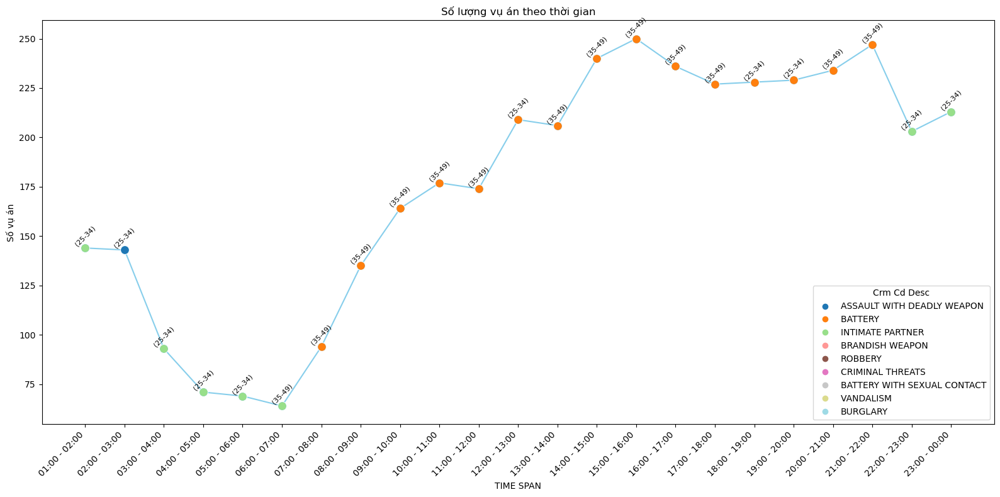

In [73]:
# Đếm số vụ án theo TIME SPAN
time_occ_counts = df.groupby('TIME SPAN').size().reset_index(name='Số vụ án')

# Tìm Crm Cd Desc và Age Group phổ biến nhất theo TIME SPAN
def get_most_frequent(x):
    crm_cd_mode = x['Crm Cd Desc'].mode()
    age_group_mode = x['Age Group'].mode()
    return pd.Series({'Crm Cd Desc': crm_cd_mode.iloc[0] if not crm_cd_mode.empty else None, 'Age Group': age_group_mode.iloc[0] if not age_group_mode.empty else None})

most_frequent_by_time = df.groupby('TIME SPAN').apply(get_most_frequent).reset_index()
most_frequent_by_time.rename(columns={'TIME SPAN': 'TIME'}, inplace=True) # Đổi tên cột

# Merge sử dụng tên cột mới
plot_data = pd.merge(time_occ_counts, most_frequent_by_time, left_on='TIME SPAN', right_on='TIME', how='left')
plot_data = plot_data.drop(columns=['TIME'])

# Tạo bảng màu cố định cho Crm Cd Desc (không cần chú thích)
unique_crm_cd = df['Crm Cd Desc'].unique()
num_colors = min(len(unique_crm_cd), 20)  # Giới hạn số lượng màu tối đa là 20 (của tab20)
cmap = plt.cm.get_cmap('tab20', num_colors) #lấy colormap
crm_cd_colors = {crm_cd: cmap(i) for i, crm_cd in enumerate(unique_crm_cd)}


# Vẽ line plot
plt.figure(figsize=(16, 8))
sns.lineplot(x='TIME SPAN', y='Số vụ án', data=plot_data, marker = 'o', markersize = 10, color = 'skyblue') #thêm marker


plt.xlabel('TIME SPAN')
plt.ylabel('Số vụ án')
plt.title('Số lượng vụ án theo thời gian')

# Hiển thị nhãn Age Group và chấm màu cho Crm Cd Desc
for index, row in plot_data.iterrows():
    color = crm_cd_colors.get(row['Crm Cd Desc'], 'gray') 
    plt.plot(row['TIME SPAN'], row['Số vụ án'], marker='o', markersize=8, color=color) #vẽ chấm màu
    plt.text(row['TIME SPAN'], row['Số vụ án'] + 0.2, f"({row['Age Group']})", ha='center', va='bottom', fontsize=8, rotation=45)


plt.xticks(rotation=45, ha='right')
# Tạo handles cho legend
handles = [plt.Line2D([0], [0], marker='o', color='w', label=crm_cd, markersize=8, markerfacecolor=color) for crm_cd, color in crm_cd_colors.items()]

# Thêm legend
plt.legend(handles=handles, title='Crm Cd Desc', loc='lower right')  
plt.tight_layout()
plt.show()

## Trực quan hóa trung bình Vict Age tính theo Descent Desc và Crm Cd Desc bằng heat map

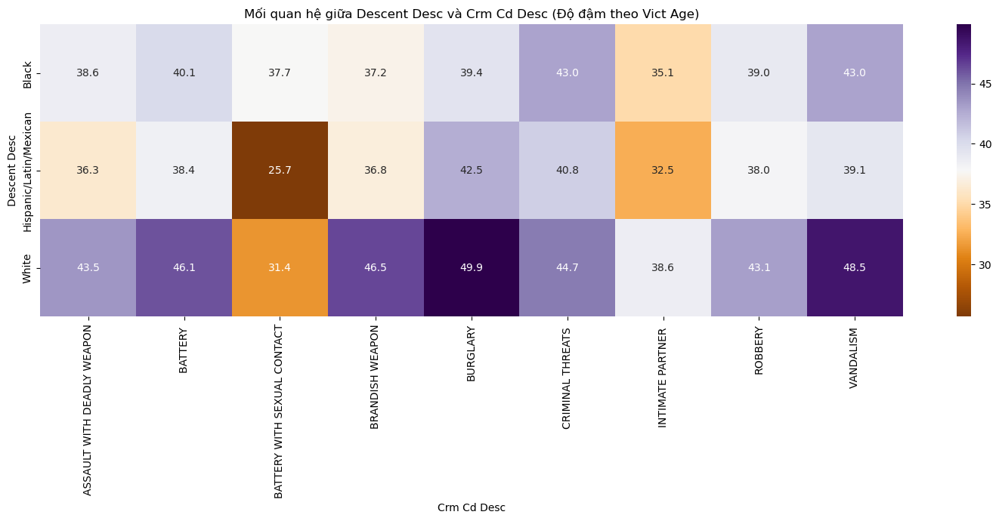

In [75]:
# Loại bỏ dòng
df_heatmap = df[~df['Descent Desc'].isin(['Filipino', 'Korean', 'Other Asian', 'Unknown', 'Other'])]

# Tạo bảng pivot với giá trị trung bình của 'Vict Age'
descent_crime_pivot = df_heatmap.pivot_table(index='Descent Desc', columns='Crm Cd Desc', values='Vict Age', aggfunc='mean', fill_value=0)

# Vẽ heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(descent_crime_pivot, cmap='PuOr', annot=True, fmt=".1f")
plt.title('Mối quan hệ giữa Descent Desc và Crm Cd Desc (Độ đậm theo Vict Age)')
plt.tight_layout()
plt.show()

# Dự đoán 

In [77]:
# Split data
# X = df[['Vict Sex Category', 'Vict Descent Category', 'Weapon Used Cd','Premis Cd']]
X = df[['TIME SPAN', 'Age Group','AREA NAME', 'Descent Desc', 'Weapon Type', 'Vict Sex']]
y = df['Crm Cd Desc']

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier  # Added VotingClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, f1_score, roc_auc_score, roc_curve, accuracy_score

numerical_cols = X.select_dtypes(include=np.number).columns.tolist()
categorical_cols = X.select_dtypes(include='object').columns.tolist()

# Impute and preprocess
numerical_imputer = SimpleImputer(strategy='mean')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Preprocessing pipeline for numerical and categorical columns
ct = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', numerical_imputer),
            ('scaler', StandardScaler())
        ]), numerical_cols),
        ('cat', Pipeline([
            ('imputer', categorical_imputer),
            ('encoder', OneHotEncoder(categories='auto', handle_unknown='ignore'))
        ]), categorical_cols)
    ]
)

# Preprocess the feature matrix
X_transformed = ct.fit_transform(X)

# Split the preprocessed data
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

# Logistic Regression
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)
logistic_predictions = logistic_model.predict(X_test)

# Random Forest Classification
rf_model = RandomForestClassifier(n_estimators=1000, max_depth=10, min_samples_split=5, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)

# Support Vector Classifier (SVC)
svc_model = SVC(kernel='rbf')
svc_model.fit(X_train, y_train)
svc_predictions = svc_model.predict(X_test)

# Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb_model.fit(X_train, y_train)
gb_predictions = gb_model.predict(X_test)

In [79]:
# Evaluate the models using accuracy and classification report
logistic_accuracy = accuracy_score(y_test, logistic_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)
svc_accuracy = accuracy_score(y_test, svc_predictions)
gb_accuracy = accuracy_score(y_test, gb_predictions)

print(f"Logistic Regression Accuracy: {logistic_accuracy:.2f}")
print(f"Random Forest Classification Accuracy: {rf_accuracy:.2f}")
print(f"SVC Accuracy: {svc_accuracy:.2f}")
print(f"Gradient Boosting Classification Accuracy: {gb_accuracy:.2f}")

Logistic Regression Accuracy: 0.49
Random Forest Classification Accuracy: 0.50
SVC Accuracy: 0.50
Gradient Boosting Classification Accuracy: 0.48


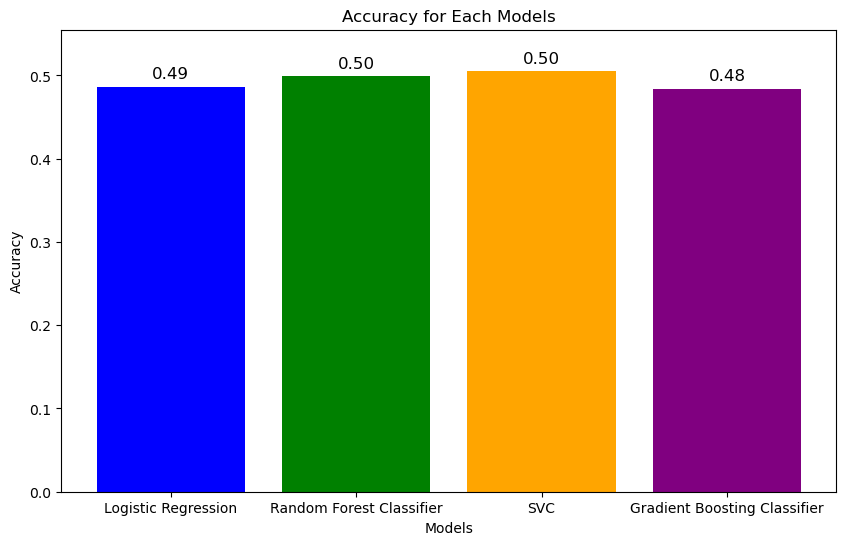

In [80]:
Models = ['Logistic Regression', 'Random Forest Classifier', 'SVC', 'Gradient Boosting Classifier']
Accuracy = [logistic_accuracy, rf_accuracy, svc_accuracy, gb_accuracy]

# Tạo bar chart
plt.figure(figsize=(10, 6))
plt.bar(Models, Accuracy, color=['blue', 'green', 'orange', 'purple'])

# Tiêu đề
plt.title('Accuracy for Each Models')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, max(Accuracy) + 0.05)

# In giá trị
for i, v in enumerate(Accuracy):
    plt.text(i, v + 0.01, f"{v:.2f}", ha='center', fontsize=12)

plt.show()